In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from bokeh.plotting import figure, show
import seaborn as sns
from bokeh.models import ColumnDataSource,HoverTool,ColorPicker,CustomJS,Slider,Select
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.events import Tap

from bokeh.layouts import column
from bokeh.palettes import Category10
df= pd.read_csv("./HR_comma_sep.csv")
# Giả sử DataFrame df có cột 'left' chứa các giá trị 0 và 1
df.head(10)
df['left_label'] = df['left'].map({0: 'Chưa nghỉ việc', 1: 'Đã nghỉ việc'})


In [2]:
print(f"Kích thước của file :  {df.shape}" )
print(f"Data có {len(df.columns)} cột")
# df['sales'].value_counts()

Kích thước của file :  (14999, 11)
Data có 11 cột


In [3]:
# Liệt kê số lượng giá trị khác nhau trong mỗi cột
for col in df.columns:
    unique_count = df[col].nunique()  # Đếm số lượng giá trị duy nhất trong cột
    print(f"Cột '{col}' có {unique_count} giá trị khác nhau.")

Cột 'satisfaction_level' có 92 giá trị khác nhau.
Cột 'last_evaluation' có 65 giá trị khác nhau.
Cột 'number_project' có 6 giá trị khác nhau.
Cột 'average_montly_hours' có 215 giá trị khác nhau.
Cột 'time_spend_company' có 8 giá trị khác nhau.
Cột 'Work_accident' có 2 giá trị khác nhau.
Cột 'left' có 2 giá trị khác nhau.
Cột 'promotion_last_5years' có 2 giá trị khác nhau.
Cột 'sales' có 10 giá trị khác nhau.
Cột 'salary' có 3 giá trị khác nhau.
Cột 'left_label' có 2 giá trị khác nhau.


In [4]:
df['promotion_last_5years'].unique()

array([0, 1], dtype=int64)

In [5]:
print(df['left'].value_counts())


left
0    11428
1     3571
Name: count, dtype: int64


In [6]:
df.describe()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years
count,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000
mean,0.612834,0.716102,3.803054,201.050337,3.498233,0.144610,0.238083,0.021268
std,0.248631,0.171169,1.232592,49.943099,1.460136,0.351719,0.425924,0.144281
min,0.090000,0.360000,2.000000,96.000000,2.000000,0.000000,0.000000,0.000000
25%,0.440000,0.560000,3.000000,156.000000,3.000000,0.000000,0.000000,0.000000
50%,0.640000,0.720000,4.000000,200.000000,3.000000,0.000000,0.000000,0.000000
75%,0.820000,0.870000,5.000000,245.000000,4.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,7.000000,310.000000,10.000000,1.000000,1.000000,1.000000


In [7]:
df.columns

Index(['satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company', 'Work_accident', 'left',
       'promotion_last_5years', 'sales', 'salary', 'left_label'],
      dtype='object')

In [8]:
df.isnull().sum()

satisfaction_level       0
last_evaluation          0
number_project           0
average_montly_hours     0
time_spend_company       0
Work_accident            0
left                     0
promotion_last_5years    0
sales                    0
salary                   0
left_label               0
dtype: int64

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   satisfaction_level     14999 non-null  float64
 1   last_evaluation        14999 non-null  float64
 2   number_project         14999 non-null  int64  
 3   average_montly_hours   14999 non-null  int64  
 4   time_spend_company     14999 non-null  int64  
 5   Work_accident          14999 non-null  int64  
 6   left                   14999 non-null  int64  
 7   promotion_last_5years  14999 non-null  int64  
 8   sales                  14999 non-null  object 
 9   salary                 14999 non-null  object 
 10  left_label             14999 non-null  object 
dtypes: float64(2), int64(6), object(3)
memory usage: 1.3+ MB


# Nội dung 1: Làm quen với dữ liệu và Matplotlib

### Nhiệm vụ:
1. **Tải tập dữ liệu** `HR_comma_sep.csv` và sử dụng pandas để đọc dữ liệu.
2. **Thực hiện phân tích cơ bản** (sử dụng `describe()`, `info()`) để hiểu cấu trúc và các đặc điểm của dữ liệu.
3. **Sử dụng Matplotlib để vẽ**:
   - Một **biểu đồ cột** (bar plot) thể hiện số lượng nhân viên theo mức lương (`salary`).
   - Một **biểu đồ phân tán** (scatter plot) giữa `satisfaction_level` và `last_evaluation`, với màu sắc khác nhau cho nhân viên đã nghỉ việc (`left = 1`) và chưa nghỉ việc (`left = 0`).

### Gợi ý:
- Xem các trang 136-147 trong tài liệu để học cách sử dụng Matplotlib cho các biểu đồ cơ bản.


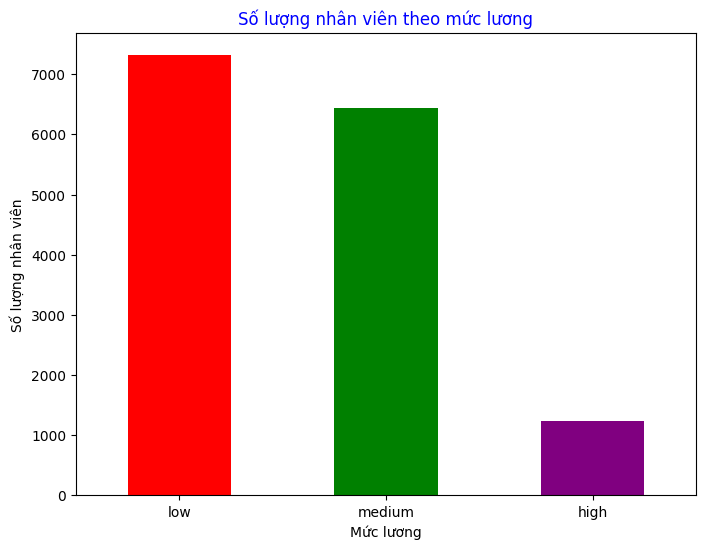

In [10]:
import matplotlib.pyplot as plt

# Giả sử df là DataFrame đã được định nghĩa
salary_counts = df['salary'].value_counts()

# Tạo biểu đồ cột
plt.figure(figsize=(8, 6))
salary_counts.plot(kind='bar', color=['red', 'green', 'purple'])

# Tiêu đề và các nhãn
plt.title('Số lượng nhân viên theo mức lương', color='blue')  # Màu tiêu đề là blue
plt.xlabel('Mức lương', color='black')  # Màu của nhãn x
plt.ylabel('Số lượng nhân viên', color='black')  # Màu của nhãn y
plt.xticks(rotation=0)

# Hiển thị biểu đồ
plt.show()


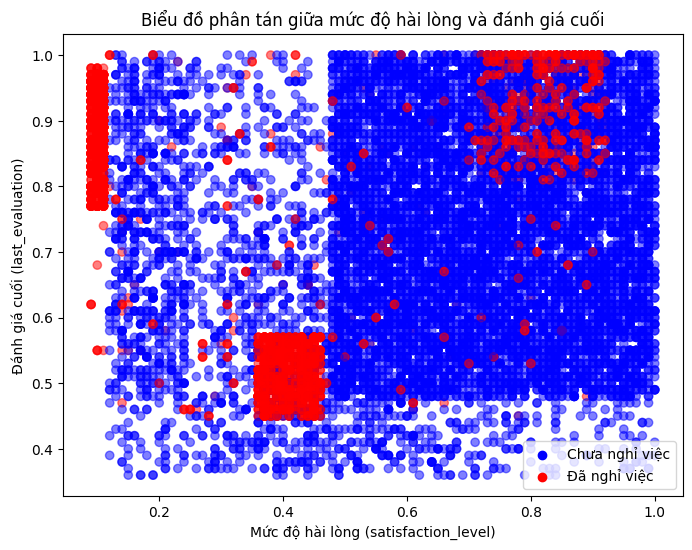

In [11]:
# Tạo biểu đồ phân tán giữa satisfaction_level và last_evaluation
plt.figure(figsize=(8, 6))

# Màu sắc theo 'left' (0: chưa nghỉ việc, 1: đã nghỉ việc)
colors = df['left'].map({0: 'blue', 1: 'red'})

# Vẽ biểu đồ phân tán
plt.scatter(df['satisfaction_level'], df['last_evaluation'], c=colors, alpha=0.5)

# Thêm kí hiệu cho các nhóm
plt.scatter([], [], c='blue', label='Chưa nghỉ việc')
plt.scatter([], [], c='red',  label='Đã nghỉ việc')

# Tiêu đề và nhãn cho các trục
plt.title('Biểu đồ phân tán giữa mức độ hài lòng và đánh giá cuối')
plt.xlabel('Mức độ hài lòng (satisfaction_level)')
plt.ylabel('Đánh giá cuối (last_evaluation)')

# Thêm chú thích
plt.legend()

# Hiển thị biểu đồ
plt.show()


# Nội dung 2: Trực quan hóa nâng cao với Seaborn

### Nhiệm vụ:
1. **Sử dụng Seaborn để vẽ**:
   - Một **lmplot** giữa `satisfaction_level` và `last_evaluation` với `hue='left'` (xem trang 151-153).
   - Một **boxplot** so sánh phân phối `satisfaction_level` theo mức lương (`salary`) (xem trang 156-157).
   - Một **countplot** thể hiện số lượng nhân viên theo `salary`, phân loại theo `left` (xem trang 159-161).

2. **Viết nhận xét ngắn về xu hướng hoặc mối quan hệ mà bạn nhận thấy từ các biểu đồ.**

### Gợi ý:
- Xem các trang 150-165 để học cách sử dụng Seaborn cho các biểu đồ thống kê nâng cao.


### 1. Sử dụng `lmplot` giữa `satisfaction_level` và `last_evaluation` với `hue='left'`
- Đoạn mã dưới đây vẽ biểu đồ `lmplot`, giúp bạn nhìn thấy mối quan hệ giữa `satisfaction_level` và `last_evaluation`, phân loại theo cột `left` (nhân viên đã nghỉ việc).


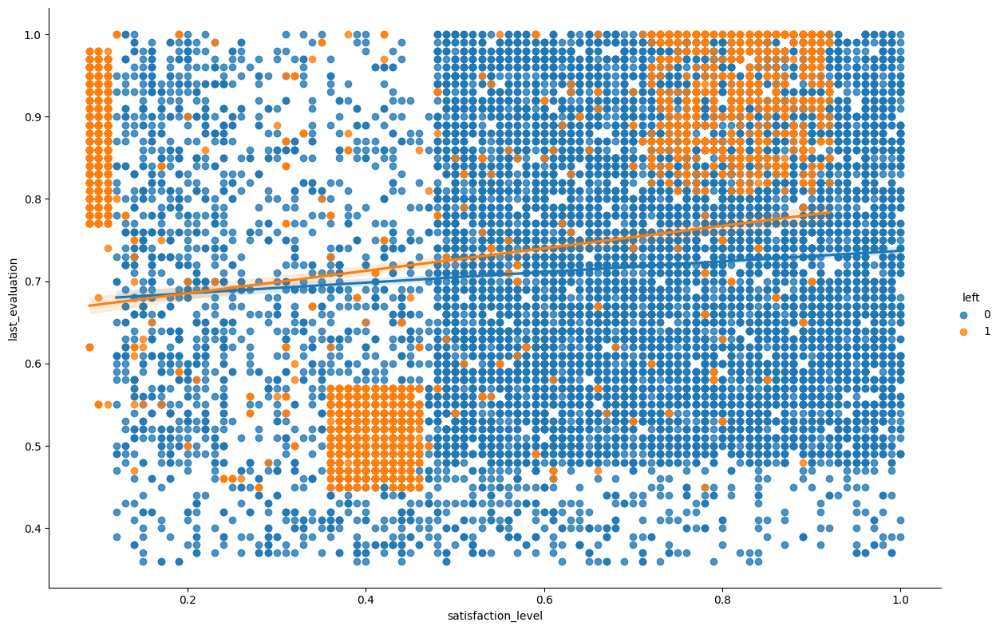

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

# Tạo biểu đồ với kích thước tùy chỉnh
sns.lmplot(x='satisfaction_level', y='last_evaluation', data=df, hue='left', height=8, aspect=1.5)

# Hiển thị biểu đồ
plt.show()


### 2. Sử dụng `boxplot` so sánh phân phối `satisfaction_level` theo mức lương (`salary`)
- Đoạn mã dưới đây sử dụng biểu đồ `boxplot` để so sánh phân phối mức độ hài lòng (`satisfaction_level`) theo các mức lương (`salary`).
- Mục đích là phân tích mức độ hài lòng của nhân viên ở các nhóm lương khác nhau.

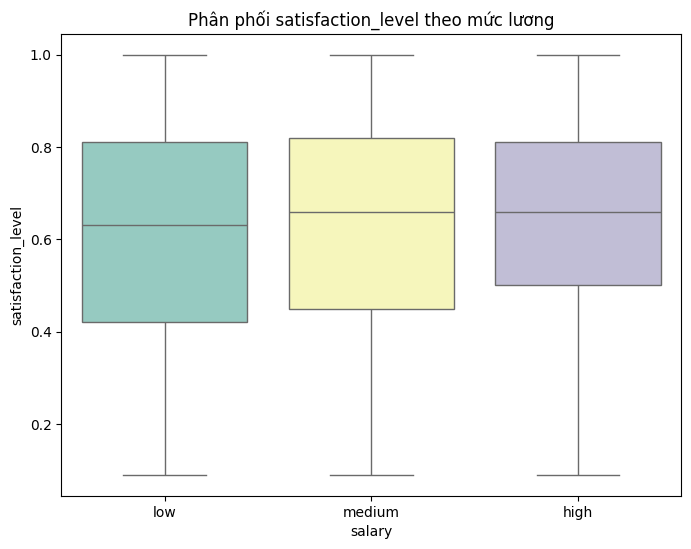

In [13]:
plt.figure(figsize=(8, 6))
sns.boxplot(x='salary', y='satisfaction_level', data=df, hue='salary', palette='Set3', legend=False)
plt.title('Phân phối satisfaction_level theo mức lương')
plt.show()


### 3. Sử dụng `countplot` thể hiện số lượng nhân viên theo `salary`, phân loại theo `left`
- Đoạn mã dưới đây sử dụng biểu đồ `countplot` để thể hiện số lượng nhân viên theo các mức lương (`salary`), phân loại theo trạng thái nghỉ việc (`left`).
- Mục đích là phân tích sự phân bố của nhân viên đã nghỉ việc và chưa nghỉ việc trong từng nhóm lương.


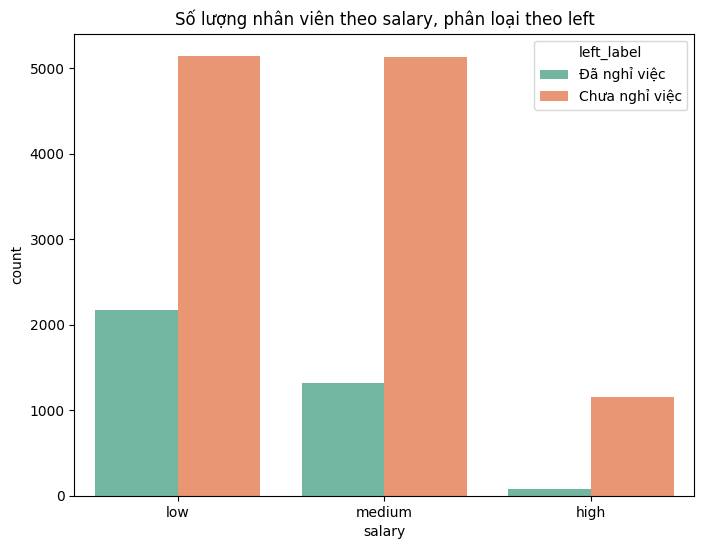

In [14]:
# Vẽ countplot thể hiện số lượng nhân viên theo salary, phân loại theo left
plt.figure(figsize=(8, 6))
sns.countplot(x='salary', hue='left_label', data=df, palette='Set2')
plt.title('Số lượng nhân viên theo salary, phân loại theo left')

plt.show()


### 1. **lmplot:**
- Dữ liệu trải rộng trên toàn bộ phạm vi của hai trục `satisfaction_level` (mức độ hài lòng) và `last_evaluation` (đánh giá lần cuối).
- Đường hồi quy (`fit_reg=True`) có độ dốc nhẹ, cho thấy mối quan hệ giữa `satisfaction_level` và `last_evaluation` không quá mạnh.
- **Chưa nghỉ việc:** Phân bố đều và trải rộng khắp biểu đồ.
- **Đã nghỉ việc:** Phân thành 3 nhóm chính:
  - `satisfaction_level (~0.4)` và `last_evaluation (~0.5)` → Cho thấy nhóm này không hài lòng với công việc hiện tại và có năng suất làm việc thấp.
  - `satisfaction_level (<0.2)` và `last_evaluation (~0.8 - 1)` → Cho thấy nhóm này bị trả lương thấp so với năng suất làm việc.
  - `satisfaction_level (~0.8 - 1)` và `last_evaluation (~0.8 - 1)` → Cho thấy nhóm này tìm thấy công việc phù hợp hơn.

---

### 2. **boxplot:**
- Mức độ hài lòng của nhân viên không có sự chênh lệch đáng kể giữa các nhóm lương.
- Đường trung vị của ba nhóm lương nằm ở khoảng 0.6 - 0.7, nghĩa là mức hài lòng trung bình của nhân viên không quá khác biệt dù lương cao hay thấp.

---

### 3. **countplot:**
- Biểu đồ cho thấy nhân viên có mức lương thấp là nhóm nghỉ việc cao nhất, giảm dần với nhóm nhân viên có mức lương trung bình và thấp nhất là nhóm nhân viên có lương cao. Điều này cho thấy mức lương là một yếu tố quan trọng ảnh hưởng đến quyết định nghỉ việc của nhân viên.


# Nội dung 3: Trực quan hóa tương tác với Bokeh

### Nhiệm vụ:
1. **Sử dụng Bokeh để vẽ**:
   - Một **biểu đồ phân tán tương tác (interactive scatter plot)** giữa `satisfaction_level` và `last_evaluation`, với tính năng hover tool hiển thị thông tin `salary` và `left` khi di chuột qua các điểm (xem trang 183-184).

2. **Sử dụng `column layout` để xếp đọc hai biểu đồ**:
   - (1) Biểu đồ cột thể hiện số lượng nhân viên theo `salary`.
   - (2) Biểu đồ phân tán tương tác giữa `satisfaction_level` và `last_evaluation` như trên.
   - Đảm bảo cả hai biểu đồ hiển thị cùng lúc trong một giao diện (xem trang 169-176).

3. **Thêm tính năng tương tác như ẩn/hiện (hide click policy)** cho các nhóm nhân viên (`left = 0` hoặc `left = 1`) trong biểu đồ phân tán (xem trang 177-179).

### Gợi ý:
- Xem các trang 166-188 để học cách sử dụng Bokeh cho trực quan tương tác.


### 3.1 Sử dụng Bokeh để vẽ biểu đồ phân tán tương tác giữa `satisfaction_level` và `last_evaluation`
- Biểu đồ phân tán sẽ hiển thị mối quan hệ giữa `satisfaction_level` và `last_evaluation`.
- Tính năng **hover tool** sẽ cho phép bạn xem thông tin chi tiết của từng điểm dữ liệu, như mức lương (`salary`) và trạng thái nghỉ việc (`left`), khi di chuột qua các điểm.


In [15]:
output_notebook()
salary_color_map = {0: "blue", 1 : "orange"}
df['color'] = df['left'].map(salary_color_map)  # Ánh xạ màu sắc vào cột 'color'

# Tạo ColumnDataSource từ DataFrame
source = ColumnDataSource(data=df)
# Tạo figure cho biểu đồ phân tán
p = figure(title="Mối quan hệ giữa satisfaction_level và last_evaluation",
           x_axis_label='Satisfaction Level', y_axis_label='Last Evaluation',width=1000, height=600,
           tools="pan,box_zoom,reset,wheel_zoom")

# Thêm tính năng hover tool để hiển thị thông tin chi tiết
hover = HoverTool()
hover.tooltips = [("Satisfaction Level", "@satisfaction_level"),
                  ("Last Evaluation", "@last_evaluation"),
                  ("Salary", "@salary"),
                  ("Left", "@left")]
p.add_tools(hover)

# Vẽ biểu đồ phân tán
p.scatter(x='satisfaction_level', y='last_evaluation', source=source, size=8, color='color', alpha=0.5,legend_field="left")

# Hiển thị biểu đồ
show(p)


Loading BokehJS ...

### 1.2. Sử dụng `column layout` để xếp đọc hai biểu đồ: một biểu đồ cột và một biểu đồ phân tán
- Biểu đồ cột thể hiện số lượng nhân viên theo mức lương (`salary`).
- Biểu đồ phân tán thể hiện mối quan hệ giữa `satisfaction_level` và `last_evaluation`.
- Cả hai biểu đồ sẽ hiển thị trong một giao diện cùng lúc nhờ sử dụng `column layout`.


In [16]:
# Import thư viện Bokeh
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.models import HoverTool, ColumnDataSource, Legend, LegendItem
from bokeh.layouts import column
from bokeh.palettes import Category10

# Đảm bảo Bokeh hiển thị trong notebook
output_notebook()

# Tạo DataFrame df_salary với số lượng nhân viên theo mức lương
df_salary = df['salary'].value_counts().reset_index()
df_salary.columns = ['salary', 'count']  # Đổi tên cột

# Tạo danh sách màu sắc, mỗi màu cho một mức lương
colors = Category10[len(df_salary['salary'].unique())]

# Thêm một cột 'color' vào df_salary để chứa màu sắc tương ứng
df_salary['color'] = [colors[i] for i in range(len(df_salary))]

# Chuyển df_salary thành ColumnDataSource
source_salary = ColumnDataSource(df_salary)

# Biểu đồ cột thể hiện số lượng nhân viên theo mức lương
p1 = figure(x_range=df_salary['salary'].astype(str).tolist(), height=400, width=600, title="Số lượng nhân viên theo Mức Lương",
            toolbar_location=None, tools="")

# Gán màu sắc cho mỗi cột (vbar) từ cột 'color' trong ColumnDataSource
p1.vbar(x='salary', top='count', source=source_salary, width=0.9,
        color='color', legend_field="salary")

# Biểu đồ phân tán giữa satisfaction_level và last_evaluation
p2 = figure(title="Mối quan hệ giữa Satisfaction Level và Last Evaluation",
            x_axis_label='Satisfaction Level',
            y_axis_label='Last Evaluation',
            tools="pan,box_zoom,reset,wheel_zoom", width=1100, height=500)

# Thêm hover tool cho p2
hover = HoverTool()

hover.tooltips = [
    ("Satisfaction Level", "@satisfaction_level"),
    ("Last Evaluation", "@last_evaluation"),
    ("Salary", "@salary")
]

hover.point_policy = "follow_mouse"  # Tooltip sẽ theo chuột, tránh bị chồng lên nhau
p2.add_tools(hover)

# Mã hóa màu theo mức lương (low, medium, high)
salary_color_map = {"low": "blue", "medium": "orange", "high": "green"}
df['color'] = df['salary'].map(salary_color_map)  # Ánh xạ màu sắc vào cột 'color'

# Lọc dữ liệu theo mức lương (low, medium, high) và tạo ColumnDataSource riêng biệt cho từng mức lương
df_low = df[df['salary'] == 'low']
df_medium = df[df['salary'] == 'medium']
df_high = df[df['salary'] == 'high']

source_low = ColumnDataSource(df_low)
source_medium = ColumnDataSource(df_medium)
source_high = ColumnDataSource(df_high)

# Vẽ biểu đồ phân tán cho các nhóm lương
scatter_low = p2.scatter('satisfaction_level', 'last_evaluation', source=source_low, size=6,
                         color='blue', fill_alpha=0.6)
scatter_medium = p2.scatter('satisfaction_level', 'last_evaluation', source=source_medium, size=6,
                            color='orange', fill_alpha=0.6)
scatter_high = p2.scatter('satisfaction_level', 'last_evaluation', source=source_high, size=6,
                          color='green', fill_alpha=0.6)

# Tạo legend cho các mức lương
legend = Legend(items=[
    LegendItem(label="Low Salary", renderers=[scatter_low]),
    LegendItem(label="Medium Salary", renderers=[scatter_medium]),
    LegendItem(label="High Salary", renderers=[scatter_high])
])

# Thêm legend vào biểu đồ
p2.add_layout(legend, 'right')

# Thiết lập tính năng ẩn dữ liệu khi bấm vào mục trong legend cho p2
p2.legend.click_policy = "hide"

# Hiển thị cả hai biểu đồ
show(column(p1, p2))


Loading BokehJS ...

### 3. Thêm tính năng tương tác như ẩn/hiện (hide click policy) cho các nhóm nhân viên (`left = 0` hoặc `left = 1`) trong biểu đồ phân tán

- **Mục đích**: Tính năng này giúp người dùng ẩn/hiện các nhóm nhân viên đã nghỉ việc (`left = 1`) và chưa nghỉ việc (`left = 0`) trong biểu đồ phân tán bằng cách sử dụng **click policy** của Bokeh.
- **Cách thực hiện**: Chúng ta sẽ sử dụng tính năng `click_policy` để cho phép ẩn hoặc hiển thị các điểm dữ liệu khi người dùng nhấn vào nhóm tương ứng trong biểu đồ phân tán.

In [17]:
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.models import HoverTool, ColumnDataSource, CustomJS, Slider, ColorPicker
from bokeh.layouts import column
from bokeh.events import Tap

# Đảm bảo Bokeh hiển thị trong notebook
output_notebook()

# Ensure Bokeh displays in notebook
output_notebook()

# Create data from DataFrame df and split into two groups
df_left_0 = df[df['left'] == 0]  # Filter data where left = 0
df_left_1 = df[df['left'] == 1]  # Filter data where left = 1

# Create ColumnDataSource for each group
source_left_0 = ColumnDataSource(df_left_0)
source_left_1 = ColumnDataSource(df_left_1)

# Scatter plot
p = figure(title="Scatter Plot with Data Show/Hide and Filtering",
           x_axis_label='Satisfaction Level',
           y_axis_label='Last Evaluation',
           tools="pan,box_zoom,reset,tap,wheel_zoom,zoom_in,zoom_out",
           width=800, height=400)

# Add hover tool
hover = HoverTool()
hover.tooltips = [("Salary", "@salary"), ("Left", "@left"), ("Satisfaction Level", "@satisfaction_level")]
p.add_tools(hover)

# Scatter plot for group left = 0 (Not Left)
left_0 = p.scatter('satisfaction_level', 'last_evaluation', source=source_left_0,
                   size=8, color='#2ca02c', legend_label="Left = 0 : Chưa nghỉ việc", fill_alpha=0.6, name="Not Left")

# Scatter plot for group left = 1 (Left)
left_1 = p.scatter('satisfaction_level', 'last_evaluation', source=source_left_1,
                   size=8, color='#ff7f0e', legend_label="Left = 1 : Đã nghỉ việc", fill_alpha=0.6, name="Left")

# JavaScript callback để ẩn/hiện các nhóm dữ liệu khi nhấn vào
callback = CustomJS(args=dict(left_0=left_0, left_1=left_1), code=""" 
    var selected = cb_obj.selected;
    var indices = selected.indices;
    
    if (indices.length == 0) {
        left_0.visible = !left_0.visible;
        left_1.visible = !left_1.visible;
    } else {
        left_0.visible = !left_0.visible;
        left_1.visible = !left_1.visible;
    }
""")


# Slider to change point size
size_slider = Slider(start=5, end=20, value=8, step=1, title="Size of Points")
size_slider_callback = CustomJS(args=dict(left_0=left_0, left_1=left_1, size_slider=size_slider), code=""" 
    var size = size_slider.value;
    left_0.glyph.size = size;
    left_1.glyph.size = size;
""")

# Attach callback to Slider to change point size
size_slider.js_on_change('value', size_slider_callback)

p.legend.click_policy = "hide"


# Hiển thị slider và color picker cùng với biểu đồ
layout = column( size_slider,p)
plt.show()
# Hiển thị biểu đồ
show(layout)


Loading BokehJS ...

Loading BokehJS ...

# Nội dung 4: Tổng hợp và phân tích

### Nhiệm vụ:
1. **Chọn ít nhất 3 biểu đồ từ các nội dung trước** (một từ Matplotlib, một từ Seaborn, một từ Bokeh) và cải tiến chúng (ví dụ: thêm tiêu đề, nhấn trục, chú thích, hoặc thay đổi màu sắc).
2. **Viết một báo cáo ngắn** (khoảng 1000 từ) trong Jupyter Notebook, bao gồm:
   - **Phần 1 (khoảng 200 từ)**: Mô tả tập dữ liệu và mục tiêu phân tích.
   - **Phần 2 (khoảng 300 từ)**: Giải thích cách tạo biểu đồ và lý do chọn loại biểu đồ.
   - **Phần 3 (khoảng 300 từ)**: Phân tích xu hướng và thông tin chi tiết từ biểu đồ.
   - **Phần 4 (khoảng 200 từ)**: Đề xuất hành động cho bộ phận nhân sự.

3. **(Tùy chọn nâng cao)** Thêm một **slider widget** từ Bokeh để điều chỉnh ngưỡng `satisfaction_level` và cập nhật biểu đồ theo thời gian thực (xem trang 186-188). Thực hiện chọn nâng cao nếu hoàn thành tốt ít nhất 1 điểm.


### 4.1 **Chọn ít nhất 3 biểu đồ từ các nội dung trước** (một từ Matplotlib, một từ Seaborn, một từ Bokeh) và cải tiến chúng (ví dụ: thêm tiêu đề, nhấn trục, chú thích, hoặc thay đổi màu sắc).

# **Seaborn cải tiến**

<Figure size 1400x1000 with 0 Axes>

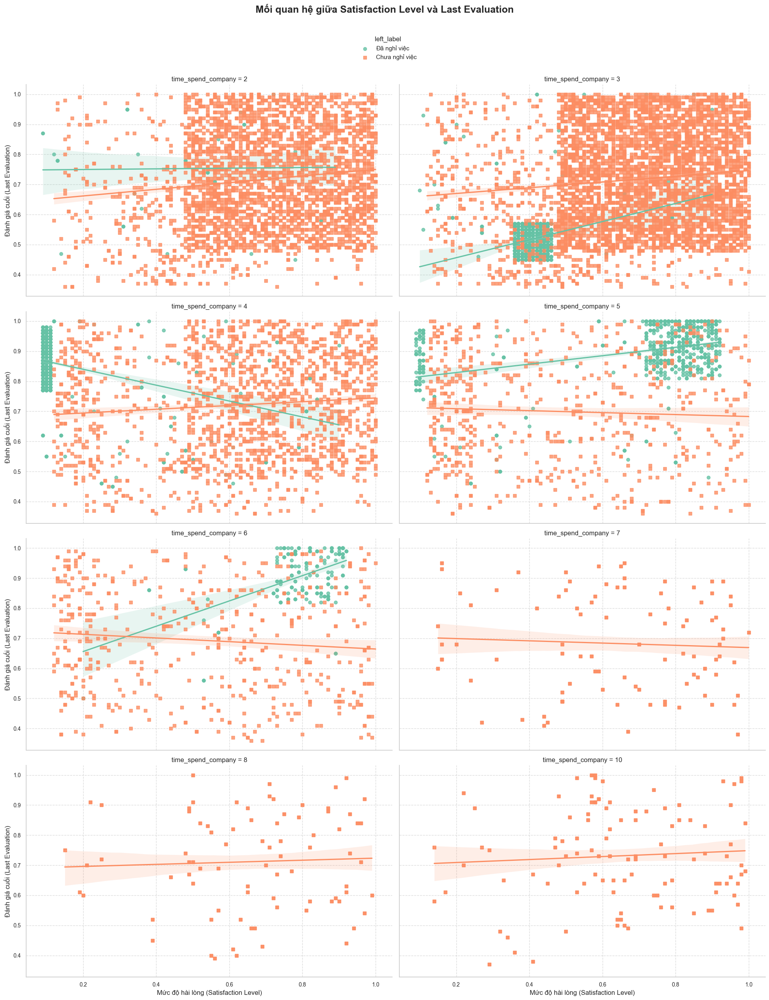

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

# Áp dụng một style đẹp hơn từ Seaborn
sns.set(style="whitegrid")

# Tạo một figure với kích thước đẹp hơn
plt.figure(figsize=(14, 10))

# Vẽ lmplot giữa satisfaction_level và last_evaluation với hue='left_label'
# Sử dụng col_wrap=2 để chia biểu đồ thành nhiều hàng, mỗi hàng có 2 biểu đồ
g = sns.lmplot(x='satisfaction_level', y='last_evaluation', hue='left_label', col="time_spend_company", 
               data=df, aspect=1.5, markers=["o", "s"], palette="Set2", height=6, col_wrap=2)

# Thêm tiêu đề và nhãn cho các trục
g.fig.suptitle('Mối quan hệ giữa Satisfaction Level và Last Evaluation', fontsize=18, fontweight='bold', y=1.05)
g.set_axis_labels('Mức độ hài lòng (Satisfaction Level)', 'Đánh giá cuối (Last Evaluation)', fontsize=12)

# Tinh chỉnh các trục cho đẹp hơn
for ax in g.axes.flatten(): 
    ax.tick_params(axis='both', which='major', labelsize=10)
    ax.grid(True, linestyle='--', alpha=0.7)  # Thêm grid nhẹ cho các biểu đồ

# Điều chỉnh vị trí của legend để nằm trên cùng và ở giữa
g.legend.set_bbox_to_anchor((0.5, 1))  # Đặt legend ở giữa và trên cùng của biểu đồ
g.legend.set_loc('center')  # Căn giữa legend

# Hiển thị biểu đồ
plt.tight_layout()
plt.show()


# **Matplotlib cải tiến**

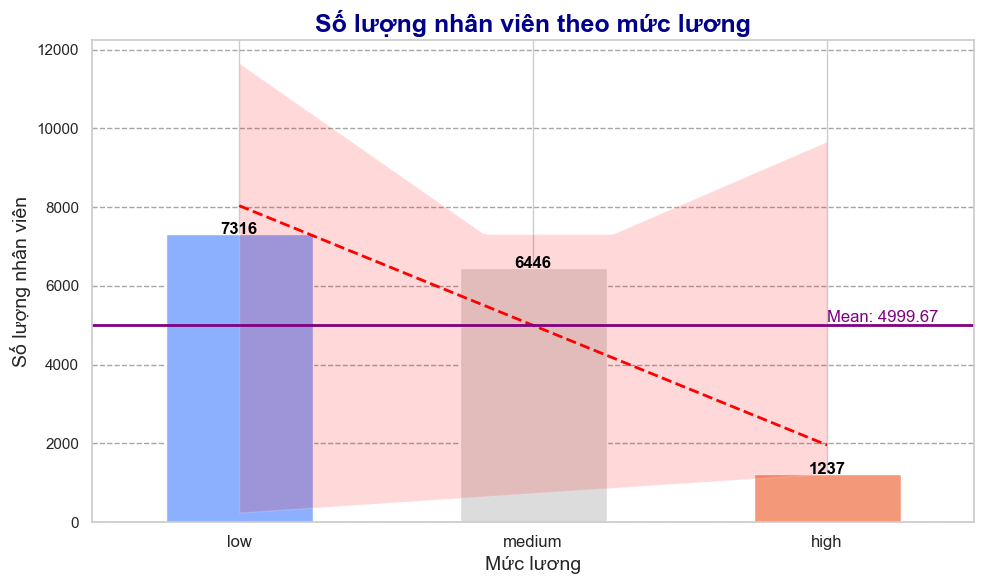

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Tạo biểu đồ cột (bar plot) cho số lượng nhân viên theo mức lương
salary_counts = df['salary'].value_counts()

# Tạo một biểu đồ với kích thước lớn hơn
fig, ax = plt.subplots(figsize=(10, 6))

# Vẽ biểu đồ cột với màu sắc động (gradient màu sắc)
colors = sns.color_palette("coolwarm", len(salary_counts))  # Gradient màu sắc
salary_counts.plot(kind='bar', color=colors, ax=ax)

# Thêm tiêu đề với font lớn và màu sắc đẹp
ax.set_title('Số lượng nhân viên theo mức lương', fontsize=18, fontweight='bold', color='darkblue')

# Thêm nhãn cho trục x và trục y
ax.set_xlabel('Mức lương', fontsize=14)
ax.set_ylabel('Số lượng nhân viên', fontsize=14)

# Điều chỉnh góc quay của nhãn trên trục x
ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=12)

# Thêm lưới để giúp dễ dàng so sánh các cột
ax.grid(axis='y', linestyle='--', alpha=0.7, color='grey')

# Thêm nhãn vào mỗi cột (số lượng nhân viên)
for i, v in enumerate(salary_counts):
    ax.text(i, v + 0.1, str(v), ha='center', fontsize=12, fontweight='bold', color='black')

# Thêm một đường xu hướng (trendline) cho các cột
sns.regplot(x=np.arange(len(salary_counts)), y=salary_counts.values, scatter=False, ax=ax, color='red', line_kws={'linewidth': 2, 'linestyle': '--'})

# Thêm thống kê vào biểu đồ (giá trị trung bình)
mean_value = salary_counts.mean()
ax.axhline(mean_value, color='purple', linestyle='-', linewidth=2)
ax.text(len(salary_counts) - 1, mean_value + 0.1, f'Mean: {mean_value:.2f}', color='purple', fontsize=12, va='bottom')

# Điều chỉnh bố cục cho biểu đồ
plt.tight_layout()

# Hiển thị biểu đồ
plt.show()


# **Bokeh cải tiến**

In [20]:
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.models import HoverTool, ColumnDataSource, CustomJS, Slider, ColorPicker
from bokeh.layouts import column
import pandas as pd

# Đảm bảo Bokeh hiển thị trong notebook
output_notebook()

# Đọc dữ liệu từ file CSV
df = pd.read_csv("./HR_comma_sep.csv")

# Tạo ColumnDataSource chứa toàn bộ dữ liệu gốc
source_all = ColumnDataSource(df)

# Tạo ColumnDataSource cho từng nhóm (Left = 0, Left = 1)
source_left_0 = ColumnDataSource(df[df['left'] == 0])  # Nhóm Not Left
source_left_1 = ColumnDataSource(df[df['left'] == 1])  # Nhóm Left

# Tạo scatter plot
p = figure(title="Scatter Plot with Data Show/Hide and Filtering",
           x_axis_label='Satisfaction Level',
           y_axis_label='Last Evaluation',
           tools="pan,box_zoom,reset,tap,wheel_zoom,zoom_in,zoom_out",
           width=800, height=400)

# Thêm công cụ Hover
hover = HoverTool()
hover.tooltips = [("Salary", "@salary"), ("Left", "@left"), ("Satisfaction Level", "@satisfaction_level")]
p.add_tools(hover)

# Scatter plot cho nhóm Left = 0 (Not Left)
left_0 = p.scatter('satisfaction_level', 'last_evaluation', source=source_left_0,
                   size=8, color='#2ca02c', legend_label="Left = 0 : Not Left", fill_alpha=0.6, name="Not Left")

# Scatter plot cho nhóm Left = 1 (Left)
left_1 = p.scatter('satisfaction_level', 'last_evaluation', source=source_left_1,
                   size=8, color='#ff7f0e', legend_label="Left = 1 : Left", fill_alpha=0.6, name="Left")

# JavaScript callback để hiển thị/ẩn nhóm khi click
callback = CustomJS(args=dict(left_0=left_0, left_1=left_1), code="""
    var selected = cb_obj.selected;
    var indices = selected.indices;

    // Hiển thị hoặc ẩn dữ liệu tùy vào việc chọn
    if (indices.length == 0) {
        left_0.visible = !left_0.visible;
        left_1.visible = !left_1.visible;
    } else {
        left_0.visible = !left_0.visible;
        left_1.visible = !left_1.visible;
    }
""")

# Gắn callback vào công cụ tap
p.select(dict(type=Tap)).callback = callback

# Thêm slider để lọc theo mức độ hài lòng
slider = Slider(start=0, end=1, value=0, step=0.01, title="Satisfaction Level")

# JavaScript callback để cập nhật ColumnDataSource khi giá trị slider thay đổi
slider_callback = CustomJS(args=dict(source_all=source_all, source_left_0=source_left_0, source_left_1=source_left_1, slider=slider), code="""
    var source_all_data = source_all.data;
    var source0 = source_left_0.data;
    var source1 = source_left_1.data;
    var threshold = slider.value;

    var new_satisfaction_0 = [];
    var new_evaluation_0 = [];
    var new_salary_0 = [];
    var new_left_0 = [];

    var new_satisfaction_1 = [];
    var new_evaluation_1 = [];
    var new_salary_1 = [];
    var new_left_1 = [];

    // Lọc cho nhóm Left = 0 (Not Left)
    for (var i = 0; i < source_all_data['satisfaction_level'].length; i++) {
        if (source_all_data['satisfaction_level'][i] >= threshold && source_all_data['left'][i] == 0) {
            new_satisfaction_0.push(source_all_data['satisfaction_level'][i]);
            new_evaluation_0.push(source_all_data['last_evaluation'][i]);
            new_salary_0.push(source_all_data['salary'][i]);
            new_left_0.push(source_all_data['left'][i]);
        }
    }

    // Lọc cho nhóm Left = 1 (Left)
    for (var i = 0; i < source_all_data['satisfaction_level'].length; i++) {
        if (source_all_data['satisfaction_level'][i] >= threshold && source_all_data['left'][i] == 1) {
            new_satisfaction_1.push(source_all_data['satisfaction_level'][i]);
            new_evaluation_1.push(source_all_data['last_evaluation'][i]);
            new_salary_1.push(source_all_data['salary'][i]);
            new_left_1.push(source_all_data['left'][i]);
        }
    }

    // Cập nhật dữ liệu cho nhóm Left = 0
    source_left_0.data['satisfaction_level'] = new_satisfaction_0;
    source_left_0.data['last_evaluation'] = new_evaluation_0;
    source_left_0.data['salary'] = new_salary_0;
    source_left_0.data['left'] = new_left_0;

    // Cập nhật dữ liệu cho nhóm Left = 1
    source_left_1.data['satisfaction_level'] = new_satisfaction_1;
    source_left_1.data['last_evaluation'] = new_evaluation_1;
    source_left_1.data['salary'] = new_salary_1;
    source_left_1.data['left'] = new_left_1;

    // Emit changes để cập nhật lại biểu đồ
    source_left_0.change.emit();
    source_left_1.change.emit();
""")

# Gắn callback vào slider
slider.js_on_change('value', slider_callback)

# ColorPicker để thay đổi màu sắc cho nhóm Left = 0 (Not Left)
color_picker_left_0 = ColorPicker(title="Change Left = 0 Color", color="#2ca02c")
color_picker_left_0_callback = CustomJS(args=dict(left_0=left_0, color_picker=color_picker_left_0), code="""
    left_0.glyph.fill_color = color_picker.color;
""")

# Gắn callback vào ColorPicker cho nhóm Left = 0
color_picker_left_0.js_on_change('color', color_picker_left_0_callback)

# ColorPicker để thay đổi màu sắc cho nhóm Left = 1 (Left)
color_picker_left_1 = ColorPicker(title="Change Left = 1 Color", color="#ff7f0e")
color_picker_left_1_callback = CustomJS(args=dict(left_1=left_1, color_picker=color_picker_left_1), code="""
    left_1.glyph.fill_color = color_picker.color;
""")

# Gắn callback vào ColorPicker cho nhóm Left = 1
color_picker_left_1.js_on_change('color', color_picker_left_1_callback)

# Slider để thay đổi kích thước điểm
size_slider = Slider(start=5, end=20, value=8, step=1, title="Size of Points")
size_slider_callback = CustomJS(args=dict(left_0=left_0, left_1=left_1, size_slider=size_slider), code="""
    var size = size_slider.value;
    left_0.glyph.size = size;
    left_1.glyph.size = size;
""")

# Gắn callback vào Slider để thay đổi kích thước điểm
size_slider.js_on_change('value', size_slider_callback)

# Hiển thị layout với slider, color pickers và biểu đồ
layout = column(slider, color_picker_left_0, color_picker_left_1, size_slider, p)
p.legend.click_policy = "hide"

# Hiển thị biểu đồ
show(layout)


Loading BokehJS ...

### 4.3. **(Tùy chọn nâng cao)** Thêm một **slider widget** từ Bokeh để điều chỉnh ngưỡng `satisfaction_level` và cập nhật biểu đồ theo thời gian thực (xem trang 186-188). Thực hiện chọn nâng cao nếu hoàn thành tốt ít nhất 1 điểm.


In [21]:
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.models import HoverTool, ColumnDataSource, CustomJS, Slider, ColorPicker
from bokeh.layouts import column
import pandas as pd

# Đảm bảo Bokeh hiển thị trong notebook
output_notebook()

# Đọc dữ liệu từ file CSV
df = pd.read_csv("./HR_comma_sep.csv")

# Tạo ColumnDataSource chứa toàn bộ dữ liệu gốc
source_all = ColumnDataSource(df)

# Tạo ColumnDataSource cho từng nhóm (Left = 0, Left = 1)
source_left_0 = ColumnDataSource(df[df['left'] == 0])  # Nhóm Not Left
source_left_1 = ColumnDataSource(df[df['left'] == 1])  # Nhóm Left

# Tạo scatter plot
p = figure(title="Scatter Plot with Data Show/Hide and Filtering",
           x_axis_label='Satisfaction Level',
           y_axis_label='Last Evaluation',
           tools="pan,box_zoom,reset,tap,wheel_zoom,zoom_in,zoom_out",
           width=800, height=400)

# Thêm công cụ Hover
hover = HoverTool()
hover.tooltips = [("Salary", "@salary"), ("Left", "@left"), ("Satisfaction Level", "@satisfaction_level")]
p.add_tools(hover)

# Scatter plot cho nhóm Left = 0 (Not Left)
left_0 = p.scatter('satisfaction_level', 'last_evaluation', source=source_left_0,
                   size=8, color='#2ca02c', legend_label="Left = 0 : Not Left", fill_alpha=0.6, name="Not Left")

# Scatter plot cho nhóm Left = 1 (Left)
left_1 = p.scatter('satisfaction_level', 'last_evaluation', source=source_left_1,
                   size=8, color='#ff7f0e', legend_label="Left = 1 : Left", fill_alpha=0.6, name="Left")

# JavaScript callback để hiển thị/ẩn nhóm khi click
callback = CustomJS(args=dict(left_0=left_0, left_1=left_1), code="""
    var selected = cb_obj.selected;
    var indices = selected.indices;

    // Hiển thị hoặc ẩn dữ liệu tùy vào việc chọn
    if (indices.length == 0) {
        left_0.visible = !left_0.visible;
        left_1.visible = !left_1.visible;
    } else {
        left_0.visible = !left_0.visible;
        left_1.visible = !left_1.visible;
    }
""")

# Gắn callback vào công cụ tap
p.select(dict(type=Tap)).callback = callback

# Thêm slider để lọc theo mức độ hài lòng
slider = Slider(start=0, end=1, value=0, step=0.01, title="Satisfaction Level")

# JavaScript callback để cập nhật ColumnDataSource khi giá trị slider thay đổi
slider_callback = CustomJS(args=dict(source_all=source_all, source_left_0=source_left_0, source_left_1=source_left_1, slider=slider), code="""
    var source_all_data = source_all.data;
    var source0 = source_left_0.data;
    var source1 = source_left_1.data;
    var threshold = slider.value;

    var new_satisfaction_0 = [];
    var new_evaluation_0 = [];
    var new_salary_0 = [];
    var new_left_0 = [];

    var new_satisfaction_1 = [];
    var new_evaluation_1 = [];
    var new_salary_1 = [];
    var new_left_1 = [];

    // Lọc cho nhóm Left = 0 (Not Left)
    for (var i = 0; i < source_all_data['satisfaction_level'].length; i++) {
        if (source_all_data['satisfaction_level'][i] >= threshold && source_all_data['left'][i] == 0) {
            new_satisfaction_0.push(source_all_data['satisfaction_level'][i]);
            new_evaluation_0.push(source_all_data['last_evaluation'][i]);
            new_salary_0.push(source_all_data['salary'][i]);
            new_left_0.push(source_all_data['left'][i]);
        }
    }

    // Lọc cho nhóm Left = 1 (Left)
    for (var i = 0; i < source_all_data['satisfaction_level'].length; i++) {
        if (source_all_data['satisfaction_level'][i] >= threshold && source_all_data['left'][i] == 1) {
            new_satisfaction_1.push(source_all_data['satisfaction_level'][i]);
            new_evaluation_1.push(source_all_data['last_evaluation'][i]);
            new_salary_1.push(source_all_data['salary'][i]);
            new_left_1.push(source_all_data['left'][i]);
        }
    }

    // Cập nhật dữ liệu cho nhóm Left = 0
    source_left_0.data['satisfaction_level'] = new_satisfaction_0;
    source_left_0.data['last_evaluation'] = new_evaluation_0;
    source_left_0.data['salary'] = new_salary_0;
    source_left_0.data['left'] = new_left_0;

    // Cập nhật dữ liệu cho nhóm Left = 1
    source_left_1.data['satisfaction_level'] = new_satisfaction_1;
    source_left_1.data['last_evaluation'] = new_evaluation_1;
    source_left_1.data['salary'] = new_salary_1;
    source_left_1.data['left'] = new_left_1;

    // Emit changes để cập nhật lại biểu đồ
    source_left_0.change.emit();
    source_left_1.change.emit();
""")

# Gắn callback vào slider
slider.js_on_change('value', slider_callback)

# ColorPicker để thay đổi màu sắc cho nhóm Left = 0 (Not Left)
color_picker_left_0 = ColorPicker(title="Change Left = 0 Color", color="#2ca02c")
color_picker_left_0_callback = CustomJS(args=dict(left_0=left_0, color_picker=color_picker_left_0), code="""
    left_0.glyph.fill_color = color_picker.color;
""")

# Gắn callback vào ColorPicker cho nhóm Left = 0
color_picker_left_0.js_on_change('color', color_picker_left_0_callback)

# ColorPicker để thay đổi màu sắc cho nhóm Left = 1 (Left)
color_picker_left_1 = ColorPicker(title="Change Left = 1 Color", color="#ff7f0e")
color_picker_left_1_callback = CustomJS(args=dict(left_1=left_1, color_picker=color_picker_left_1), code="""
    left_1.glyph.fill_color = color_picker.color;
""")

# Gắn callback vào ColorPicker cho nhóm Left = 1
color_picker_left_1.js_on_change('color', color_picker_left_1_callback)

# Slider để thay đổi kích thước điểm
size_slider = Slider(start=5, end=20, value=8, step=1, title="Size of Points")
size_slider_callback = CustomJS(args=dict(left_0=left_0, left_1=left_1, size_slider=size_slider), code="""
    var size = size_slider.value;
    left_0.glyph.size = size;
    left_1.glyph.size = size;
""")

# Gắn callback vào Slider để thay đổi kích thước điểm
size_slider.js_on_change('value', size_slider_callback)
p.legend.click_policy = "hide"
# Hiển thị layout với slider, color pickers và biểu đồ
layout = column(slider, color_picker_left_0, color_picker_left_1, size_slider, p)

# Hiển thị biểu đồ
show(layout)


Loading BokehJS ...

# **BÁO CÁO BÀI TẬP QUÁ TRÌNH: PHÂN TÍCH VÀ TRỰC QUAN HÓA DỮ LIỆU NHÂN SỰ**

### **Tên nhóm:** Trịnh Long Phát
### **Thành viên:**
- 3122411088 - Huỳnh Duy Khang - [Đóng góp: Matplotlib]
- 3122411150 - Trịnh Long Phát - [Đóng góp: Seaborn]
- 3122411109 - Trương Phú Kiệt - [Đóng góp: Bokeh]
### **Phân công công việc**
| Trương Phú Kiệt                                           | Huỳnh Duy Khang                                                | Trịnh Long Phát                                             |
|-----------------------------------------------------------|----------------------------------------------------------------|-------------------------------------------------------------|
| Xây dựng biểu đồ Bokeh                                    | Xây dựng biểu đồ Matplotlib                                    | Xây dựng biểu đồ Seaborn                                    |
| Trực quan hóa tương tác với Bokeh                         | Làm quen với dữ liệu và Matplotlib                             | Trực quan hóa và nâng cao với Seaborn                       |
| Cải tiến biểu đồ Bokeh                                    | Cải tiến biểu đồ Matplotlib                                    | Cải tiến biểu đồ Seaborn                                    |
| Mô tả tập dữ liệu và mục tiêu phân tích                   | Mô tả tập dữ liệu và mục tiêu phân tích                                                      | Đề xuất hành động cho bộ phận nhân sự                       |
| Giải thích cách tạo và lý do chọn loại biểu đồ Bokeh      | Giải thích cách tạo và lý do chọn loại biểu đồ Matplotlib      | Giải thích cách tạo và lý do chọn loại biểu đồ Seaborn      |
| Phân tích xu hướng và thông tin chi tiết từ biểu đồ Bokeh | Phân tích xu hướng và thông tin chi tiết từ biểu đồ Matplotlib | Phân tích xu hướng và thông tin chi tiết từ biểu đồ Seaborn |



# 1. Mô tả tập dữ liệu và mục tiêu phân tích

(200-250 từ)

### Giới thiệu về tập dữ liệu

Tập dữ liệu `HR_comma_sep.csv` được lấy từ GitHub tại địa chỉ https://github.com/PacktPublishing/Python-Data-Analysis-Third-Edition/tree/master/chapter05. Tập dữ liệu này bao gồm 14,999 dòng và 10 cột, chứa thông tin về nhân viên trong một công ty. Mục tiêu chính của phân tích này là tìm hiểu các yếu tố có thể ảnh hưởng đến quyết định nghỉ việc của nhân viên, được thể hiện qua cột mục tiêu `left`.

### Mô tả các cột trong dữ liệu

Dưới đây là bảng mô tả chi tiết các cột trong tập dữ liệu:

| Cột              | Mô tả                                                                                                                                           |
|------------------|-------------------------------------------------------------------------------------------------------------------------------------------------|
| `satisfaction_level` | Mức độ hài lòng của nhân viên với công việc, có giá trị từ 0 đến 1. Mức độ hài lòng thấp có thể là yếu tố dẫn đến quyết định nghỉ việc. |
| `last_evaluation`   | Đánh giá công việc cuối cùng của nhân viên, là điểm số đánh giá hiệu suất công việc của họ. Giá trị này có thể ảnh hưởng đến quyết định ở lại hay nghỉ việc.Có giá tri từ 0 đến 1 |
| `number_project`    | Số lượng dự án mà nhân viên tham gia. Nhân viên tham gia nhiều dự án có thể có cảm giác quá tải hoặc thỏa mãn công việc, ảnh hưởng đến quyết định nghỉ việc.Có 6 giá trị khác nhau |
| `average_monthly_hours` | Số giờ làm việc trung bình mỗi tháng. Mức độ làm việc quá nhiều có thể dẫn đến sự căng thẳng và quyết định nghỉ việc.Có 215 giá trị khác nhau  |
| `time_spend_company`   | Số năm nhân viên đã làm việc tại công ty. Nhân viên làm việc lâu dài có thể có xu hướng gắn bó hơn với công ty, nhưng cũng có thể quyết định nghỉ việc khi có vấn đề . Có 8 giá trị khác nhau  |
| `work_accident`     | Biến nhị phân cho biết nhân viên có gặp tai nạn lao động hay không. Tai nạn có thể là một yếu tố dẫn đến quyết định nghỉ việc.Có 2 giá trị khác nhau  |
| `promotion_last_5years` | Cột này cho biết nhân viên có được thăng chức trong 5 năm qua hay không. Việc thiếu thăng tiến có thể dẫn đến sự không hài lòng và nghỉ việc. Có 2 giá trị khác nhau |
| `sales`             | Phòng ban của nhân viên (ví dụ: marketing, IT, v.v.). Các phòng ban có thể có sự khác biệt về mức độ hài lòng và quyết định nghỉ việc của nhân viên.Có 10 giá trị khác nhau : sales,accounting,hr,technical,support,management,IT,product_mng,marketing,RanD |
| `salary`            | Mức lương của nhân viên, có thể là low, medium hoặc high. Mức lương có thể ảnh hưởng trực tiếp đến động lực và quyết định ở lại hay nghỉ việc. Có 3 giá trị khác nhau là : low, medium, high |
| `left`              | Cột mục tiêu phân tích, có giá trị 0 nếu nhân viên không nghỉ việc và 1 nếu nhân viên đã rời công ty. Đây là cột chính chúng ta cần phân tích. |

### Mục tiêu phân tích

Mục tiêu của phân tích này là khám phá các yếu tố ảnh hưởng đến quyết định nghỉ việc của nhân viên, được thể hiện qua cột `left`. Cột `left` là cột mục tiêu (target), và các yếu tố khác như mức độ hài lòng (`satisfaction_level`), đánh giá công việc cuối cùng (`last_evaluation`), số giờ làm việc trung bình mỗi tháng (`average_monthly_hours`), số năm làm việc (`time_spend_company`), và các yếu tố khác sẽ được nghiên cứu để tìm ra mối quan hệ với quyết định nghỉ việc.

Các bước tiếp theo sẽ bao gồm việc sử dụng các biểu đồ và phân tích thống kê để khám phá mối quan hệ giữa các biến số này và quyết định nghỉ việc của nhân viên.

# 2. Giải thích cách tạo biểu đồ và lí do chọn loại biểu đồ

### 2.1 Biểu đồ phân tán giữa satisfaction_level và last_evaluation (Matplotlib)

#### 2.1.1. Mô tả biểu đồ
1. Tên biểu đồ: Biểu đồ phân tán giữa mức độ hài lòng và đánh giá hiệu suất gần nhất
2.  Trục x (Mức độ hài lòng - satisfaction_level):
   - Trục này biểu thị mức độ hài lòng của các nhân viên với công ty.
   - Mức độ hài lòng này có thể dao động trong khoảng từ 0 đến 1, với giá trị gần 1 biểu thị mức độ hài lòng cao, còn giá trị gần 0 cho thấy mức độ hài lòng thấp.
3. Trục y (Đánh giá hiệu suất gần nhất - last_evaluation):
   - Trục này đại diện cho đánh giá hiệu suất gần nhất của các nhân viên.
   - Giá trị của trục này có thể dao động từ 0 đến 1, với giá trị gần 1 cho thấy hiệu suất làm việc cao, còn giá trị gần 0 cho thấy hiệu suất thấp.
4. Các điểm dữ liệu:
   - Mỗi điểm trên biểu đồ đại diện cho một nhân viên trong công ty, với tọa độ của điểm được xác định bởi mức độ hài lòng (satisfaction_level) và đánh giá hiệu suất gần nhất (last_evaluation).
   - Các điểm này được tô màu khác nhau để phân biệt hai nhóm nhân viên: Màu xanh dương (Chưa nghỉ việc): Những nhân viên vẫn còn làm việc tại công ty (giá trị left = 0). Màu đỏ (Đã nghỉ việc): Những nhân viên đã rời công ty (giá trị left = 1).




#### 2.1.2.Cách tạo biểu đồ
1. Thư viện được sử dụng là pandas,matplotlib, seaborn
2. Các hàm chính là:
- df = pd.read_csv("C:\\Users\\CaRot\\Desktop\\HR_comma_sep.csv"): Đọc tệp CSV chứa dữ liệu nhân sự vào DataFrame df
- colors = df['left'].map({0: 'blue', 1: 'red'}): Màu sắc của các điểm được gán theo tình trạng nghỉ việc. Nếu 'left' = 0 (chưa nghỉ việc), màu là xanh (blue); nếu 'left' = 1 (đã nghỉ việc), màu là đỏ (red).
- plt.scatter(df['satisfaction_level'], df['last_evaluation'], c=colors, alpha=0.5): Vẽ các điểm phân tán, với trục x là mức độ hài lòng (satisfaction_level), trục y là đánh giá hiệu suất gần nhất (last_evaluation), và màu sắc được gán từ biến colors.
- plt.scatter([], [], c='blue', label='Chưa nghỉ việc') và plt.scatter([], [], c='red', label='Đã nghỉ việc'): Thêm các chú thích cho màu sắc
- plt.legend(title='Tình trạng nghỉ việc'): Chú thích về tình trạng nghỉ việc.
- plt.title(), plt.xlabel(), plt.ylabel(), plt.grid(True), và plt.tight_layout(): Tiêu đề, nhãn trục, lưới và điều chỉnh không gian hiển thị




#### 2.1.3.Lí do chọn loại biểu đồ
- Nó thể hiện mối tương quan giữa hai biến số liên tục (satisfaction_level và last_evaluation) và liên kết với biến phân loại (left). Thể hiện được xu hướng nghỉ việc tập trung chủ yếu thành 3 cụm
- Không chọn biểu đồ cột vì nó chỉ cho biết có bao nhiêu người ở mỗi mức lương, Không có mối liên hệ giữa mức lương và hành vi nghỉ việc

### 2.2 Biểu đồ cột thể hiện số lượng nhân viên theo salary phân loại theo left (Seaborn)


#### 2.2.1. Mô tả biểu đồ
1. Trục hoành (x-axis):
- Biểu diễn mức lương của nhân viên, với ba giá trị phổ biến có thể là low, medium, và high, đại diện cho các mức lương khác nhau của nhân viên trong công ty.
2. Trục tung (y-axis):
- Thể hiện số lượng nhân viên trong mỗi nhóm mức lương (low, medium, high).
3. Các cột (bars):
- Mỗi cột đại diện cho số lượng nhân viên ở từng mức lương, phân chia theo tình trạng nghỉ việc (left). Có hai màu sắc khác nhau được gán cho các nhóm này: Màu 1 (ví dụ màu xanh lá cây): Đại diện cho những nhân viên chưa nghỉ việc (left = 0). Màu 2 (ví dụ màu hồng hoặc đỏ): Đại diện cho những nhân viên đã nghỉ việc (left = 1).
4. Tên biểu đồ: Số lượng nhân viên theo salary, phân loại theo left

#### 2.2.2.Cách tạo biểu đồ
1. Thư viện được sử dụng là pandas,matplotlib, seaborn
2. Các hàm chính là:
- df = pd.read_csv("C:\\Users\\CaRot\\Desktop\\HR_comma_sep.csv"): Đọc tệp CSV chứa dữ liệu nhân sự vào DataFrame df
- sns.countplot(x='salary', hue='left', data=df, palette='Set2'):vẽ biểu đồ cột, trong đó: x='salary': Đặt biến 'salary' làm trục x, thể hiện mức lương của nhân viên. hue='left': Phân loại theo tình trạng nghỉ việc (biến 'left') để phân biệt nhân viên đã nghỉ việc và chưa nghỉ việc. palette='Set2': Chọn bảng màu 'Set2' để làm màu cho các cột.
- plt.title(): Thêm tiêu đề cho biểu đồ với font size 24.
- plt.xlabel() và plt.ylabel(): Đặt nhãn cho trục x và y, với màu sắc là đen (color='black') và kích thước chữ là 18.
- plt.legend(): Thêm chú thích với tiêu đề "Tình trạng nghỉ việc" và nhãn "Chưa nghỉ việc" và "Đã nghỉ việc" để phân biệt các nhóm.

#### 2.2.3. Lí do chọn loại biểu đồ
1. Phù hợp thể hiện xu hướng hành vi nghỉ việc có liên quan đến tiền lương
2. Không sử dụng biểu đồ phân tán có 2 đường hồi quy tuyến tính. Vì 2 đường này không thể hiện rõ được mối quan hệ giữa hành vi nghỉ việc có liên quan gì đến 2 yếu tố Mức độ hài lòng và Đánh giá hiệu suất gần nhất
3. Không chọn biểu đồ boxplot vì nó chỉ thể hiện mối quan hệ giữa tiền lương và mức độ hài lòng của nhân viên

# 2.3. Biểu đồ phân tán giữa mức độ hài lòng và đánh giá hiệu suất gần nhất và Biểu đồ cột số lượng nhân viên theo mức lương (Bokeh)

#### 2.3.1. Mô tả biểu đồ
Tên biểu đồ: Biểu đồ phân tán giữa mức độ hài lòng và đánh giá hiệu suất gần nhất và Biểu đồ cột số lượng nhân viên theo mức lương
1. Biểu đồ phân tán giữa mức độ hài lòng và đánh giá hiệu suất gần nhất
   * Trục x (Mức độ hài lòng - satisfaction_level):
   - Trục này biểu thị mức độ hài lòng của các nhân viên với công ty.
   - Mức độ hài lòng này có thể dao động trong khoảng từ 0 đến 1, với giá trị gần 1 biểu thị mức độ hài lòng cao, còn giá trị gần 0 cho thấy mức độ hài lòng thấp.
  * Trục y (Đánh giá hiệu suất gần nhất - last_evaluation):
   - Trục này đại diện cho đánh giá hiệu suất gần nhất của các nhân viên.
   - Giá trị của trục này có thể dao động từ 0 đến 1, với giá trị gần 1 cho thấy hiệu suất làm việc cao, còn giá trị gần 0 cho thấy hiệu suất thấp.
  * Các điểm dữ liệu:
   - Mỗi điểm trên biểu đồ đại diện cho một nhân viên trong công ty, với tọa độ của điểm được xác định bởi mức độ hài lòng (satisfaction_level) và đánh giá hiệu suất gần nhất (last_evaluation).
   - Các điểm này được tô màu khác nhau để phân biệt hai nhóm nhân viên: Màu xanh dương (Chưa nghỉ việc): Những nhân viên vẫn còn làm việc tại công ty (giá trị left = 0). Màu đỏ (Đã nghỉ việc): Những nhân viên đã rời công ty (giá trị left = 1).

2. Biểu đồ cột số lượng nhân viên theo mức lương
   - Trục X: Đại diện cho các mức lương: "low", "medium" và "high"; mỗi mức lương được biểu diễn bằng một cột riêng biệt
   - Trục Y : Thể hiện số lượng nhân viên tương ứng với mỗi mức lương


#### 2.3.2.Cách tạo biểu đồ
1. Thư viện pandas, bokeh.plotting, bokeh.models, bokeh.layouts
2.  Các hàm chính:
   -  Hàm figure() (Tạo biểu đồ Bokeh): Tạo biểu đồ Bokeh
   -  Hàm vbar() (Vẽ cột trong biểu đồ cột)
   -  Hàm scatter() (Vẽ điểm trong biểu đồ phân tán)
   -  Hàm HoverTool() (Công cụ hiển thị thông tin khi di chuột)
   -  Hàm CustomJS() (JavaScript callback để xử lý sự kiện tương tác)
   -  Hàm Slider() (Tạo slider để thay đổi giá trị)
   -  Hàm ColorPicker() (Tạo công cụ chọn màu)
   -  Hàm column() (Để sắp xếp các thành phần giao diện)
   -  Hàm show() (Hiển thị biểu đồ)

#### 2.3.3.Lí do chọn biểu đồ
1. Biểu đồ 2 giàu thông tin hơn biểu đồ 1. Ngoài việc nó thể hiện mối tương quan giữa hai biến số liên tục (satisfaction_level và last_evaluation) nó còn có thông tin về số lượng người ở từng mức lương


# 3. Phân tích các xu hướng hoặc thông tin chi tiết từ biểu đồ
Phân tích từ 3 biểu đồ cho thấy các xu hướng liên quan đến quyết định nghỉ việc:
- Biểu đồ phân tán giữa satisfaction_level và last_evaluation (Matplotlib) cho thấy nhân viên nghỉ việc (left=1) tập trung chủ yếu ở 3 khu vực:
1. Khu vực có mức độ hài lòng thấp (gần 0.1 - 0.3) nhưng hiệu suất cao gợi ý rằng nhân viên có năng lực tốt nhưng không hài lòng với môi trường làm việc, văn hóa công ty có thể dẫn đến nghỉ việc
2. Khu vực có cả mức độ hài lòng trung bình và hiệu suất trung bình gợi ý rằng nhân viên có năng lực và sự hài lòng trung bình, cảm thấy thiếu động lực hoặc cơ hội thăng tiến có thể dẫn đến nghỉ việc
3. Khu vực có mức độ hài lòng cao và hiệu suất tốt gợi ý rằng có thể do nguyên nhân bên ngoài như có các cơ hội tốt hơn hoặc lý do cá nhân là những nguyên nhân có thể thể dẫn đến nghỉ việc

- Biểu đồ cột thể hiện số lượng nhân viên theo salary phân loại theo left (Seaborn) chỉ ra rằng phần lớn nhân viên nghỉ việc thuộc nhóm lương thấp hoặc trung bình, trong khi đó số lượng này ở lương cao thì ít hơn. Điều này cho thấy tiền lương là yếu tố quan trọng ảnh hưởng đến sự gắn bó

- Biểu đồ Boker với HoverTool xác nhận các trường hợp cụ thể: Nhân viên có mức độ hài lòng cao, hiệu suất tốt thường nghỉ việc ngay có khi có mức lương trung bình

Tóm lại tiền lương và mức độ hài lòng là những yếu tố chính thúc đẩy nghỉ việc, trong khi các yếu tố ngoại cảnh như vấn đề riêng của từng cá nhân đôi khi cũng liên quan

# 4. Đề xuất cho bộ phận nhân sự
Dựa trên phân tích chúng tôi đề xuất:
1. Tăng lương cho nhóm Lương thấp và trung bình: Biểu đồ cột thể hiện số lượng nhân viên theo salary phân loại theo left cho thấy tỉ lệ nghỉ việc cao ở nhóm này, điều chỉnh lương có thể tăng sự gắn bó
2. Cải thiện môi trường làm việc: Biểu đồ phân tán giữa mức độ hài lòng và đánh giá hiệu suất gần nhất chỉ ra mức độ không hài lòng thấp và trung bình dẫn đến nghỉ việc. Bộ phận nhân sự nên khảo sát vấn đề này để giữ chân nhân viên
